# TP1 d'OA
### par Isaac Nivet et Cheick Fofana

## 1. Préliminaires

### Question 1.


In [4]:
exemple = [0, 1, 2, 3]

In [5]:
def f1(xs):
    return sum(x**2 for x in xs)
f1(exemple)

14

In [3]:
def f2(xs):
    n = len(xs)
    return sum(100**(i/(n-1))*xs[i] for i in range(n))
f2(exemple)

347.73028263425044

In [4]:
import numpy as np

In [5]:
def f3(xs):
    return 10 * len(xs) * sum(x**2 - 10 * np.cos(2 * np.pi * x) for x in xs)
f3(exemple)

-1040.0

In [6]:
def f4(xs):
    return sum(100 * (xs[i]**2 - xs[i+1])**2 + (xs[i] - 1)**2 for i in range(len(xs)-1))
f4(exemple)

302

### Question 2.

In [8]:
import matplotlib.pyplot as plt
import numpy as np

In [8]:
x_min, x_max = -5, 5
y_min, y_max = -5, 5
h = .01
X, Y = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

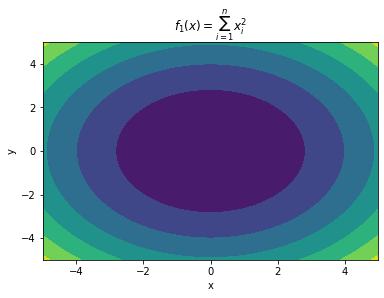

In [9]:
Z = f1((X, Y))
plt.contourf(X, Y, Z)
plt.title('$f_1(x)=\sum_{i=1}^{n} x^2_i$')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

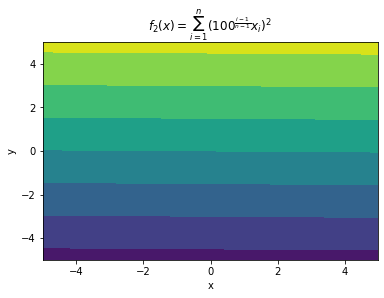

In [10]:

Z = f2((X, Y))
plt.contourf(X, Y, Z)
plt.title('$f_2(x)=\sum_{i=1}^{n} (100^{\\frac{i-1}{n-1}}x_i)^2$')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

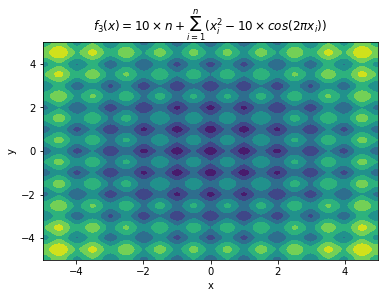

In [11]:

Z = f3((X, Y))
plt.contourf(X, Y, Z)
plt.title('$f_3(x)=10 \\times n + \sum_{i=1}^{n} (x^2_i - 10 \\times cos(2 \pi x_i))$')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

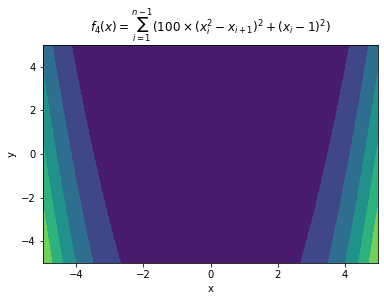

In [12]:

Z = f4((X, Y))
plt.contourf(X, Y, Z)
plt.title('$f_4(x)= \sum_{i=1}^{n-1} (100 \\times (x^2_i-x_{i+1})^2 + (x_i-1)^2)$')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

### Question 3.

In [13]:
def algo_1(f, n, x0, tmax=10**4, step_size='Useless in this algorithm'):
    """
    Renvoie le meilleur paramètre trouvé ainsi que la liste des paramètres successifs pour en arriver là.
    """
    x = np.array(x0)
    xs = []
    ts=[]
    t = 0
    while t < tmax:
        t += 1
        u = np.random.uniform(-5, 5, (n,))
        fu = f(u)
        ts.append(t)
        if xs != [] and abs(fu) < abs(f(xs[-1])):
            xs.append(u)
            x = u
        elif xs == []:
            xs.append(u)
        else:
            xs.append(xs[-1])
    return x, np.array(xs), np.array(ts)

## 2. (1+1)-ES avec step-size constant

### Question 4.

In [10]:
def algo_2(f, n, x0, tmax=10**4, step_size=10**-3):
    """
    Renvoie le meilleur paramètre trouvé ainsi que la liste des meilleurs paramètres successifs pour en arriver là.
    """
    σ = step_size
    x = np.array(x0)
    xs = []
    ts=[]
    t = 0
    mean = np.zeros(n)
    I = np.identity(n)
    while t < tmax:
        t += 1
        x_ = x + σ * np.random.multivariate_normal(mean, I)
        fx_ = f(x_)
        ts.append(t)
        print(t, x_, fx_)
        
        if xs != [] and abs(fx_) < abs(f(xs[-1])):
            xs.append(x_)
            x = x_
        elif xs == []:
            xs.append(x_)
        else:
            xs.append(xs[-1])

    return x, np.array(xs), np.array(ts)

### Question 5.

In [11]:
x, xs, ts = algo_2(f=f1, n=5, x0=(1,1,1,1,1), step_size=10**-3, tmax=2*10**4)
x

1 [0.99916359 0.99969562 1.00108233 1.00008843 1.00112795] 5.002319072739871
2 [1.00230038 0.99729905 1.00035985 0.99878933 0.9994711 ] 4.99645390371843
3 [1.00169338 0.99680078 1.00016488 0.99858584 0.99929182] 4.993089030005371
4 [1.00133125 0.99757225 0.99967911 0.99764994 1.00108696] 4.994653502875891
5 [1.00216752 0.99709338 0.99860905 0.99800917 0.99873456] 4.989247989721649
6 [1.00090704 0.99767143 0.99880409 0.99775116 0.99973167] 4.989743567149231
7 [1.0019688  0.99678905 0.99994311 0.99680089 1.00098212] 4.992993315780414
8 [1.0010385  0.99596708 0.9964811  0.99755082 0.99874423] 4.97960075389174
9 [1.00124131 0.9972242  0.99676729 0.9982874  0.99899688] 4.985057780948392
10 [1.00321501 0.99597118 0.99630467 0.996907   0.9996664 ] 4.98417841919419
11 [1.0029169  0.99678135 0.9968294  0.99719146 0.99816522] 4.983808807487745
12 [1.00109843 0.99492276 0.99683661 0.99816587 0.99944952] 4.980987050000288
13 [1.00094204 0.99466764 0.99669542 0.99681652 0.99812959] 4.97455629357284

373 [0.93916511 0.92419995 0.93901305 0.9433532  0.94826562] 4.407045100294033
374 [0.93924364 0.92456924 0.93859889 0.9431455  0.94724908] 4.404779030132802
375 [0.93932192 0.9242715  0.93938286 0.94078454 0.94878931] 4.404320338958879
376 [0.93900598 0.92444193 0.93937906 0.9417843  0.95072615] 4.409596025805379
377 [0.93879413 0.92389    0.93853595 0.94162303 0.94801742] 4.401147859436606
378 [0.93750124 0.92477822 0.93900163 0.9423972  0.94889801] 4.404367298939517
379 [0.93901214 0.92377957 0.9374219  0.94158002 0.94794413] 4.399043327236001
380 [0.93857078 0.92427713 0.93727018 0.94121646 0.94912281] 4.400401235466624
381 [0.93871278 0.92266248 0.93933143 0.94258575 0.94702173] 4.400149330163842
382 [0.9382165  0.92403414 0.93882028 0.94159811 0.94955395] 4.403732525536634
383 [0.939659   0.92445193 0.93745421 0.94194796 0.94694272] 4.400357282643785
384 [0.93766605 0.92290768 0.93717654 0.9400534  0.94769394] 4.391100274962008
385 [0.93714189 0.92205209 0.93779741 0.94043795 0.9

767 [0.87935938 0.84458372 0.86939493 0.88259652 0.8799062 ] 3.7956536769829934
768 [0.88062396 0.84443879 0.86922637 0.88110188 0.88038137] 3.795541780781634
769 [0.87953312 0.84489765 0.87148449 0.88191189 0.87811789] 3.795775370626004
770 [0.88083213 0.84496037 0.8668757  0.88191013 0.87988286] 3.793256057242198
771 [0.88127645 0.84457843 0.86593016 0.88451312 0.87865947] 3.794201883003506
772 [0.88069514 0.84484766 0.86561203 0.88184507 0.87889219] 3.788777906202089
773 [0.88108282 0.84532944 0.86515894 0.88051261 0.87851834] 3.7864857104703864
774 [0.88098629 0.84509925 0.8660338  0.87922879 0.87866936] 3.7854472407081476
775 [0.88075861 0.84510346 0.86519044 0.87973577 0.87964395] 3.7861985703908125
776 [0.88051874 0.84320276 0.86667621 0.87915795 0.87633068] 3.7783059514877815
777 [0.87988929 0.84033995 0.86650375 0.87974249 0.87579033] 3.7721606927819415
778 [0.8803368  0.84056515 0.86670406 0.88056139 0.8733935 ] 3.7709231324413306
779 [0.87898748 0.84128395 0.86670101 0.87971

1147 [0.82415276 0.78808014 0.7967976  0.81344143 0.78837934] 3.218413431798134
1148 [0.82359493 0.78836283 0.79503563 0.81345119 0.78898622] 3.2161082942831514
1149 [0.82404631 0.78738639 0.79436539 0.81318358 0.79132291] 3.2175054945098776
1150 [0.82241712 0.78955862 0.79477437 0.81240432 0.7878788 ] 3.2121928253640397
1151 [0.82350808 0.79235199 0.79445966 0.81330698 0.78691123] 3.2178508961243875
1152 [0.82491966 0.790331   0.79448115 0.81286746 0.78700209] 3.2164416372714597
1153 [0.82306775 0.7889041  0.79415896 0.81188586 0.78834533] 3.2111456494577966
1154 [0.82246981 0.7886779  0.79358806 0.81188116 0.78835399] 3.208904461554714
1155 [0.82299543 0.78850291 0.79346081 0.8121741  0.78811019] 3.209382806300016
1156 [0.82022071 0.78832497 0.79475798 0.8118076  0.78718209] 3.2045457432125044
1157 [0.82050306 0.78739797 0.79522387 0.81188385 0.78823747] 3.206075508777634
1158 [0.82028385 0.78903606 0.79305864 0.8129879  0.78912669] 3.208055761758617
1159 [0.82127169 0.78945424 0.796

1547 [0.75863852 0.71752715 0.72248677 0.72142119 0.73851549] 2.678218410025199
1548 [0.7560943  0.7173603  0.7231793  0.72032776 0.7374028 ] 2.6719076636107855
1549 [0.75554584 0.71708048 0.72124561 0.72097405 0.7378078 ] 2.669413088441355
1550 [0.75559564 0.71629688 0.72072947 0.72116616 0.73753187] 2.6674908560003496
1551 [0.75426881 0.71531479 0.72140566 0.72135049 0.73777669] 2.665683792796176
1552 [0.75488157 0.71581953 0.72192799 0.72234105 0.73692496] 2.668258787757064
1553 [0.75311816 0.71474291 0.72195812 0.72129269 0.73862563] 2.6650988949562766
1554 [0.75263448 0.71483899 0.72065811 0.72193382 0.73902128] 2.6641424382464134
1555 [0.75087335 0.71657947 0.72135588 0.72306734 0.73871249] 2.6661737629241844
1556 [0.75210608 0.71499902 0.72097656 0.72248839 0.73600876] 2.6603927146989177
1557 [0.75175946 0.71568618 0.72037307 0.72302471 0.73665068] 2.6617053041395806
1558 [0.75063339 0.71641865 0.72236847 0.72174264 0.73680118] 2.6623107977299
1559 [0.75117577 0.71519551 0.71865

1962 [0.6942948  0.64846934 0.64097354 0.65720963 0.65880792] 2.179357212436556
1963 [0.69305623 0.65116263 0.64102043 0.65798883 0.65831447] 2.181574149469629
1964 [0.69494289 0.64870955 0.63974297 0.65719905 0.6591139 ] 2.17938248442374
1965 [0.69477684 0.64929978 0.64038143 0.65725469 0.65654963] 2.1774345877745933
1966 [0.69613851 0.64750144 0.64024365 0.65731639 0.6550734 ] 2.1749648744201493
1967 [0.6980713  0.64577044 0.6394545  0.65549646 0.65545711] 2.172524680445511
1968 [0.69543579 0.64446217 0.64060344 0.65586799 0.65578358] 2.169550125023492
1969 [0.69407106 0.64418338 0.63821501 0.65676389 0.655252  ] 2.164719249008027
1970 [0.69215692 0.64361408 0.63880493 0.65611495 0.65740462] 2.1640596853021163
1971 [0.6912819  0.64381498 0.6397143  0.65553393 0.65562527] 2.161172013688268
1972 [0.69264707 0.64267225 0.640774   0.654334   0.65478019] 2.1602689807501876
1973 [0.69111079 0.64213171 0.64102993 0.65245232 0.65465384] 2.1551523096059277
1974 [0.69023958 0.64268808 0.641707

2355 [0.64357196 0.57057934 0.60058079 0.60305077 0.57736385] 1.797462194220666
2356 [0.64386085 0.57052706 0.59966185 0.60343736 0.57851053] 1.7984633364606508
2357 [0.64457555 0.57071135 0.60063348 0.60477795 0.57892613] 1.802861492569685
2358 [0.64308094 0.57219904 0.6003447  0.60283716 0.57715539] 1.7978995810009188
2359 [0.64331472 0.5708048  0.59967322 0.60231075 0.57692482] 1.7949003993730113
2360 [0.64383891 0.57082624 0.6003695  0.60315452 0.57609204] 1.7964920970039147
2361 [0.64331115 0.57017582 0.59963823 0.60240313 0.57777542] 1.7952296850650995
2362 [0.64465566 0.5711495  0.59905856 0.602131   0.57636026] 1.7954167141317965
2363 [0.64400864 0.57155975 0.600776   0.6017359  0.57828821] 1.7988628351767968
2364 [0.64536845 0.57033457 0.59840029 0.60208101 0.57741344] 1.7957726813148498
2365 [0.64390262 0.56984989 0.59880051 0.602096   0.57668733] 1.7929894054760767
2366 [0.64377506 0.57061475 0.59774447 0.59950175 0.57758239] 1.7903497316074606
2367 [0.64393862 0.56920021 0.

2755 [0.57000621 0.51839068 0.53862015 0.5383883  0.49407291] 1.4177176478313507
2756 [0.56636215 0.51944056 0.53665089 0.5366944  0.49186811] 1.408553880552443
2757 [0.56584976 0.52002875 0.53381852 0.53542238 0.49327782] 1.4055781936256444
2758 [0.56504975 0.51851198 0.53277024 0.53450192 0.49486102] 1.4025597616085552
2759 [0.56700406 0.51858211 0.53118288 0.53573458 0.49621348] 1.4058156037297096
2760 [0.56358925 0.51689544 0.53380771 0.53541282 0.49515213] 1.4016069216950282
2761 [0.56304699 0.5169732  0.53373939 0.53508766 0.49479431] 1.4003011406655992
2762 [0.5628159  0.51794007 0.53313833 0.53619899 0.49217312] 1.3990038721996974
2763 [0.56373015 0.51827788 0.53183197 0.53603252 0.48998315] 1.3966632445589617
2764 [0.56312009 0.51817561 0.53116013 0.53582942 0.48879116] 1.3937712582835189
2765 [0.56342682 0.51779475 0.53241538 0.53687723 0.48850385] 1.395900508262053
2766 [0.56463962 0.51740919 0.53240631 0.53741532 0.48894962] 1.3978736082006697
2767 [0.56310642 0.51715131 0.

3171 [0.47848353 0.42560179 0.44599009 0.46322153 0.42692943] 1.0058334583969397
3172 [0.47815407 0.42449382 0.44695892 0.46290969 0.42752081] 1.0056580229127856
3173 [0.4779625  0.42487548 0.44686913 0.46355446 0.42728962] 1.006118494280483
3174 [0.47729644 0.42517799 0.44688814 0.4615421  0.42780376] 1.0043343799263147
3175 [0.47736123 0.42610583 0.44634253 0.46244391 0.42630533] 1.0042521772511894
3176 [0.47830548 0.42671589 0.44608521 0.46293716 0.42598979] 1.0056327048794926
3177 [0.47881301 0.4269973  0.44549437 0.46296046 0.42670181] 1.0064606544040249
3178 [0.47971083 0.42530644 0.44654159 0.46038465 0.42491858] 1.0029172683400545
3179 [0.48000453 0.42576083 0.44753485 0.45978859 0.42490303] 1.0039122151238207
3180 [0.47925954 0.42584906 0.44627934 0.45936002 0.4258962 ] 1.0026015906205685
3181 [0.47941889 0.42584099 0.4455052  0.45810895 0.42506011] 1.000197815209451
3182 [0.47671997 0.42532827 0.44418943 0.45879341 0.42475129] 0.9963753593529183
3183 [0.47651386 0.42452263 0.

3578 [0.38991115 0.38131956 0.36520466 0.38341531 0.35798651] 0.7059713891928634
3579 [0.38762425 0.38137363 0.36623178 0.38271183 0.3589864 ] 0.7051637103099468
3580 [0.38760775 0.38256799 0.36529908 0.38345579 0.35973304] 0.7064876561590696
3581 [0.38696697 0.38375215 0.36575684 0.38304423 0.35860851] 0.7061101637255717
3582 [0.38849491 0.3819251  0.36564544 0.3813004  0.35897505] 0.7047447510063846
3583 [0.38816698 0.38144299 0.36454079 0.38247928 0.36103507] 0.7056990655387999
3584 [0.38878536 0.3816473  0.36653441 0.3820012  0.35819482] 0.7053846358243301
3585 [0.38894835 0.38157049 0.36498567 0.38143807 0.35947604] 0.7048094230128064
3586 [0.38951773 0.38152153 0.36446842 0.38137066 0.35952716] 0.7048233266577717
3587 [0.38674757 0.38046878 0.367104   0.38115709 0.35904757] 0.7032914070961286
3588 [0.38739779 0.38006625 0.36878772 0.37929762 0.35986066] 0.7038981599300687
3589 [0.38698513 0.38115562 0.36508118 0.38229478 0.35909726] 0.7034215001931027
3590 [0.38807175 0.37982718 

3977 [0.31119304 0.32693217 0.29572979 0.30551645 0.30150021] 0.47542453718089983
3978 [0.31001529 0.3249901  0.29533817 0.3060442  0.30094506] 0.47318366272784634
3979 [0.31088809 0.32439595 0.29455307 0.30616421 0.29923818] 0.4719256590903092
3980 [0.3092895  0.32467844 0.29562519 0.3066513  0.30018333] 0.47261538811423226
3981 [0.31161754 0.32313615 0.29366658 0.30612204 0.2984731 ] 0.47055942252270666
3982 [0.31055004 0.32348052 0.29415102 0.30652464 0.29813446] 0.4704473069265489
3983 [0.31003092 0.32374018 0.29342975 0.307653   0.29863991] 0.4708640598939597
3984 [0.31054991 0.32384803 0.29318873 0.30629941 0.29724861] 0.46945449480409307
3985 [0.30833221 0.32431813 0.29416186 0.30873514 0.29577221] 0.46958078357810695
3986 [0.30949305 0.32455142 0.29152626 0.3058652  0.29594498] 0.4672440856748426
3987 [0.30947447 0.32534155 0.29061551 0.30396734 0.2959751 ] 0.46607635842718365
3988 [0.31041322 0.32528521 0.29063639 0.30296732 0.29660338] 0.4663991085181185
3989 [0.30925694 0.32

4362 [0.24636411 0.25953741 0.232699   0.22842707 0.23983491] 0.2919034731110785
4363 [0.24698456 0.25857046 0.23220426 0.22760707 0.23915636] 0.2907796197686119
4364 [0.24538099 0.26011345 0.23307957 0.22831065 0.23689116] 0.2904400970179903
4365 [0.24581401 0.26031844 0.23319842 0.22910074 0.23703079] 0.2912424642838828
4366 [0.24601178 0.26151108 0.23315054 0.22854089 0.23698613] 0.2916623710650045
4367 [0.24665046 0.26004697 0.23182193 0.22909268 0.23682978] 0.2907740843222709
4368 [0.24402985 0.2604227  0.23533096 0.22884978 0.23688437] 0.2912376351618869
4369 [0.24436812 0.26061794 0.23261718 0.22740391 0.23749933] 0.28986670709909024
4370 [0.24521491 0.26031483 0.23248924 0.22872436 0.23813196] 0.29096707500913327
4371 [0.24447658 0.25882309 0.23318763 0.22754387 0.23686069] 0.2890138613503648
4372 [0.24387511 0.2576238  0.23470315 0.22969928 0.23802982] 0.29035060758703773
4373 [0.24631619 0.26005789 0.23285242 0.22710187 0.23674858] 0.29014717194995954
4374 [0.24304753 0.25720

4762 [0.18141318 0.17047271 0.15808375 0.16945001 0.16752789] 0.14374105909067278
4763 [0.17996352 0.17074622 0.15780597 0.16954895 0.16721691] 0.14315220669824172
4764 [0.18047253 0.16899889 0.15892313 0.17007682 0.16661443] 0.1430740096632213
4765 [0.18059671 0.16919893 0.15843863 0.16959817 0.16897944] 0.14366384029588247
4766 [0.18199522 0.16872218 0.15760047 0.16892407 0.16636725] 0.14264074307611702
4767 [0.18400375 0.1671751  0.15876573 0.17022731 0.16645361] 0.1436955898518873
4768 [0.18139341 0.16940171 0.15729668 0.16959702 0.16667276] 0.14288571475870704
4769 [0.18263246 0.16770922 0.15764378 0.17065949 0.16849808] 0.14384882165309054
4770 [0.18120207 0.16815375 0.15628923 0.16718706 0.16667956] 0.1412697859451062
4771 [0.18177252 0.16735927 0.1557094  0.16719328 0.16720144] 0.14120570512559832
4772 [0.18061602 0.16717091 0.15628608 0.16725079 0.16703386] 0.1408667341562905
4773 [0.17998755 0.16739411 0.15617586 0.16593957 0.16705552] 0.14025069187119357
4774 [0.18251092 0.1

5171 [0.10824715 0.08776961 0.06534417 0.0892904  0.09077232] 0.03990319931315659
5172 [0.10784581 0.08871808 0.06517041 0.08853553 0.08993847] 0.0396762677452688
5173 [0.1074749  0.08857791 0.06472184 0.08971189 0.08857036] 0.039478747442232204
5174 [0.10557811 0.08820309 0.06467705 0.09009428 0.08709637] 0.0388124010619322
5175 [0.10575336 0.08800466 0.0651448  0.0893102  0.08764175] 0.038829827881007355
5176 [0.10674218 0.08941831 0.06567004 0.08901983 0.08741924] 0.0392687358895451
5177 [0.10535554 0.08991854 0.06388169 0.0909731  0.08636259] 0.03900060684837202
5178 [0.10445813 0.08831059 0.06506415 0.08897546 0.08779294] 0.03856783793132018
5179 [0.10689224 0.09012856 0.06576361 0.08883444 0.08898323] 0.039683533695848344
5180 [0.1053347  0.08823997 0.06308549 0.08858993 0.08861054] 0.03856147339066961
5181 [0.10475283 0.08752412 0.06233162 0.08947982 0.08997923] 0.03862175768743968
5182 [0.10607243 0.08987462 0.06355968 0.09134861 0.08749103] 0.039367888915774876
5183 [0.1061661

5591 [0.03036617 0.01443419 0.00981145 0.02777554 0.01694875] 0.002285455343417472
5592 [0.02832912 0.01426642 0.01079559 0.02780395 0.01762565] 0.002206338018503068
5593 [0.0289244  0.01370021 0.01036786 0.02726641 0.0165992 ] 0.0021507996540570725
5594 [0.028503   0.01348008 0.01140723 0.0267834  0.01740571] 0.002144567296268288
5595 [0.02765977 0.01394505 0.00873052 0.02528454 0.01664006] 0.001951948671655027
5596 [0.02860459 0.01362285 0.00809902 0.02617166 0.01776802] 0.002070057438064292
5597 [0.02738042 0.01428898 0.00867047 0.02556886 0.01547145] 0.0019221716222408915
5598 [0.02678227 0.01318494 0.00905054 0.02601996 0.01793979] 0.0019719189741409494
5599 [0.02770298 0.015861   0.00917789 0.02556674 0.01733095] 0.0020572802658048992
5600 [0.02718647 0.01393403 0.00978004 0.02476153 0.0147397 ] 0.001859302965265304
5601 [0.02742158 0.01201042 0.01021054 0.02568287 0.01542501] 0.0018979890679391297
5602 [0.02694657 0.01302895 0.01008337 0.02418253 0.01258811] 0.001740800863722973

5985 [-0.00254459 -0.00032489  0.00310805  0.00121586  0.00040471] 1.7882599741544373e-05
5986 [-0.00201476  0.00034787 -0.0018381   0.00050263 -0.00018395] 7.845371522391948e-06
5987 [ 0.00164955 -0.00047772  0.00010155  0.00270507 -0.00086933] 1.103265137321837e-05
5988 [ 0.00062096  0.00031457  0.00071491 -0.00046957 -0.00148633] 3.4253188960589306e-06
5989 [-0.00145055  0.00101239  0.00126058 -0.00133024 -0.00121868] 7.972782746562985e-06
5990 [ 0.00073614 -0.00038368  0.00085046  0.00027099  0.00197262] 5.377063453491333e-06
5991 [ 0.00070117 -0.00102831  0.00079168  0.00067354  0.00016807] 2.6577166468142875e-06
5992 [-1.71032881e-04 -2.31988335e-04  1.09626682e-03  6.14406219e-05
 -4.13324682e-04] 1.459484010926231e-06
5993 [-0.00035858 -0.00087519  0.00024718 -0.0012377   0.00144148] 4.56540941258506e-06
5994 [-0.00026492  0.00182439  0.0001974  -0.00106338 -0.00067781] 5.027777329600581e-06
5995 [ 0.00028788  0.0006507  -0.00014298 -0.00017528 -0.00098769] 1.532979897978629e-0

6379 [ 0.00040065  0.00298097  0.00063329  0.00015605 -0.00234796] 1.4985038594007113e-05
6380 [-6.91034783e-04 -6.97122699e-04  8.93540501e-04  4.99578067e-04
  5.80238929e-05] 2.014868773444814e-06
6381 [ 0.0003376   0.0001151   0.00018381 -0.00049801 -0.0009259 ] 1.2663043826147808e-06
6382 [-1.67520633e-04 -1.57726108e-03  1.15719357e-03 -8.36415559e-04
 -7.43781284e-05] 4.56003573086342e-06
6383 [ 1.25053749e-05  6.70189283e-04 -2.79021126e-03 -8.95741450e-04
 -3.47821191e-04] 9.157921249446355e-06
6384 [ 0.00051525 -0.00170143 -0.00118014  0.00030133 -0.00113182] 5.9248680720240354e-06
6385 [-6.08687915e-05 -1.10285984e-03 -8.85364401e-04  3.34983487e-04
  1.02064881e-04] 2.1265061283815537e-06
6386 [-0.00112579  0.00155317 -0.00027597 -0.001058   -0.00135843] 6.720598345058439e-06
6387 [-0.00183806 -0.00151374 -0.00044217 -0.00074162  0.00057296] 6.743654495286641e-06
6388 [ 0.00016131  0.00023825  0.00150107 -0.00034683  0.00171429] 5.395096681213377e-06
6389 [-4.19993006e-05 -

6781 [-0.00074367  0.00208013 -0.00053819  0.00089574 -0.00017549] 6.00278746277583e-06
6782 [-0.00082768  0.00103762  0.00091649  0.00054179 -0.00053505] 3.18146837126662e-06
6783 [ 0.0013056   0.00057615  0.00295951 -0.00035622 -0.00111935] 1.2175052955421824e-05
6784 [ 0.00061552  0.00028909 -0.00122343  0.0001179   0.00114426] 3.282446711069642e-06
6785 [-1.26193898e-04  3.37795386e-05 -1.32110416e-03  1.77500700e-03
  2.77807532e-04] 4.990209032662795e-06
6786 [-6.69540446e-05  1.35391360e-03 -4.75653335e-06  1.04699379e-04
 -6.51973344e-05] 1.852800154363075e-06
6787 [ 0.00078969  0.00230369 -0.00077434  0.00066236  0.00114788] 8.286539759684739e-06
6788 [-0.00043986 -0.00031185 -0.00034122 -0.00252813 -0.00205589] 1.1025284328404517e-05
6789 [-0.00041567  0.00044893 -0.00077023  0.00065971 -0.00036348] 1.53490704638061e-06
6790 [7.98936768e-04 7.45689567e-04 8.77611638e-05 1.04925030e-04
 7.58226073e-04] 1.7879709501575089e-06
6791 [ 0.00089669 -0.00177638  0.00014328 -0.0004235

7179 [3.40694300e-04 1.50402407e-03 9.12884044e-04 4.77325306e-04
 5.72100598e-06] 3.4393904574686714e-06
7180 [-0.00040401 -0.00048139  0.00131497  0.0010779  -0.00033295] 3.3968148721567383e-06
7181 [ 0.00061893 -0.00056088 -0.00029816 -0.00045563  0.00114895] 2.314249240611391e-06
7182 [-2.07815807e-04  8.73421282e-05 -1.43759959e-03 -1.10558496e-03
  6.75993895e-04] 3.7967944810369116e-06
7183 [-0.00128392  0.00112169  0.00153207  0.0003971   0.00204973] 9.612973141272225e-06
7184 [ 0.00100231  0.0003607  -0.00041792 -0.00045325  0.00020502] 1.5568567606663853e-06
7185 [ 0.00164617 -0.00091417 -0.00028692  0.00017092 -0.00044513] 3.8552824778751096e-06
7186 [-6.59849781e-04 -1.18599252e-03 -1.21231420e-04 -1.09365874e-03
 -7.57851016e-05] 3.0585098566718307e-06
7187 [ 6.08953235e-04 -1.93086162e-04  4.09830804e-05  1.01510207e-03
 -6.80132633e-04] 1.902798538964592e-06
7188 [ 0.00045193  0.00038805  0.00052901 -0.00029119 -0.00084148] 1.4275543273480646e-06
7189 [-0.00128168  0.001

7589 [ 0.00087904  0.00207792  0.00011653 -0.00108872 -0.0006783 ] 6.749454410641878e-06
7590 [-0.00028843 -0.00010228 -0.00039578 -0.00075137  0.00196755] 4.6861204843763e-06
7591 [-3.75456690e-04 -2.07105357e-04 -9.93500731e-04  1.84649589e-03
  6.10706843e-05] 4.5841807716154955e-06
7592 [ 0.00075435  0.00128572  0.00012415 -0.00229786  0.00069996] 8.007609469163876e-06
7593 [ 0.00020557  0.00229621 -0.00011649 -0.00114524 -0.00276041] 1.4259834486229553e-05
7594 [ 0.00325648  0.00199526 -0.00054673  0.0023382   0.00094478] 2.1244443181337937e-05
7595 [-0.00031765  0.00179314  0.00086494  0.00064793 -0.00047562] 4.710391411521382e-06
7596 [-1.89684964e-04 -3.10799128e-05  1.50266097e-03 -4.33554085e-04
 -8.83764012e-04] 3.263944317437498e-06
7597 [ 0.00051363  0.00021201 -0.00071948 -0.00192797  0.00101516] 5.574041266990128e-06
7598 [-0.00146612 -0.00053795 -0.0009789  -0.00088882  0.00111179] 5.423223581545861e-06
7599 [-6.12586200e-04  1.33037990e-03  1.01911447e-04 -5.28356493e-

8003 [-0.00037055 -0.00063017 -0.00139411 -0.00170663 -0.00028056] 5.469259342300432e-06
8004 [ 0.00156992  0.00102029  0.00034653 -0.00076283 -0.00063311] 4.6084590183066905e-06
8005 [ 0.00157024 -0.00120182 -0.0007886  -0.00113731  0.00087658] 6.593783397207672e-06
8006 [ 1.38292944e-03 -1.04069790e-03  7.74981947e-05  5.18630291e-04
 -6.37305681e-04] 3.6766878429336595e-06
8007 [ 0.00067333 -0.00050669 -0.00069566  0.00163757  0.00068658] 4.347057879644611e-06
8008 [ 7.47781750e-04 -7.15203900e-04 -4.49540651e-04  4.26548169e-05
  8.71885027e-04] 2.034783894234797e-06
8009 [-2.78766353e-03 -1.10410019e-03 -3.51073980e-05  3.65325596e-04
 -7.60331689e-04] 9.70290476904273e-06
8010 [-0.00143468 -0.00061845 -0.00019196 -0.00045589 -0.0003806 ] 2.8303191919042937e-06
8011 [-0.00040894 -0.00109288  0.00248805  0.00063777  0.00067639] 8.416285140552837e-06
8012 [ 0.00057275  0.00010495 -0.0008366  -0.00095122  0.00154084] 4.317961386091776e-06
8013 [-2.16856563e-04 -5.76277335e-04 -5.4847

8422 [ 0.0004613   0.00196423  0.00082637 -0.0003484  -0.00118675] 6.28365253719606e-06
8423 [ 0.0023235  -0.0020987   0.00034472 -0.00183577  0.00022589] 1.3343129453242199e-05
8424 [-0.00081599  0.00052522 -0.00051444  0.00095025 -0.00067771] 2.568615659346296e-06
8425 [ 0.00041734  0.00071821 -0.00100903 -0.00102782 -0.000538  ] 3.0540067913809874e-06
8426 [ 0.00034333  0.00062536 -0.00022175 -0.00080463  0.0006702 ] 1.6547225696273931e-06
8427 [ 0.00148416 -0.00050437 -0.00202805 -0.00209799  0.00158534] 1.3484992147536905e-05
8428 [ 0.00219117  0.00030612  0.00047575 -0.00136811 -0.00122123] 8.484427779482954e-06
8429 [ 0.00065203 -0.00047026 -0.0004775  -0.00026983 -0.00079721] 1.5826324487092282e-06
8430 [ 0.00047556 -0.00040913  0.00065703 -0.00125542  0.00101902] 3.4397087573289484e-06
8431 [-0.0008092  -0.00127157  0.00024164  0.00030097 -0.00076874] 3.0116398021783676e-06
8432 [-3.39789934e-04  4.70313300e-04 -3.11377467e-04 -4.81461967e-05
 -1.05865372e-03] 1.55667349130682

8760 [-0.00038188 -0.00029974  0.00031932 -0.00063429  0.00112956] 2.015881779998489e-06
8761 [ 0.00029091  0.00104018  0.00013271 -0.00021666  0.00140096] 3.1938465363260955e-06
8762 [ 8.49263784e-04 -4.70426232e-05  4.63348885e-04 -5.21624829e-05
 -1.57956040e-03] 3.4358861390926123e-06
8763 [-8.36126005e-04  4.00465723e-05  5.25586413e-04 -3.33915169e-04
 -5.76914897e-04] 1.4212816409570853e-06
8764 [-0.00153647  0.00171225  0.00191192  0.00119391  0.0009549 ] 1.1285236662031057e-05
8765 [ 0.00012679 -0.00013862  0.00273529 -0.00224923 -0.00032987] 1.2684929008465243e-05
8766 [-6.45806396e-04 -2.85997257e-05  1.01707427e-03 -3.07016382e-04
 -3.38287271e-04] 1.6610212592429847e-06
8767 [ 0.00037224 -0.00012274 -0.00067987  0.0014162   0.00119677] 4.053727425335767e-06
8768 [ 1.22460363e-03  1.73184245e-03  1.61879515e-03  3.06420871e-05
 -1.37356757e-03] 9.007056865077385e-06
8769 [ 0.00228814  0.00010963 -0.00153566  0.00085318  0.00117453] 9.713306508230819e-06
8770 [-0.00112135  0

9146 [ 0.00063109 -0.00229519  0.00050457  0.00035831 -0.0011096 ] 7.2803389989059955e-06
9147 [ 0.00155306 -0.00033963 -0.00096684 -0.00110079 -0.00141447] 6.674570911630414e-06
9148 [ 0.00032108  0.0017671  -0.00029536 -0.00019298  0.00187886] 6.880322314237996e-06
9149 [ 0.0004986  -0.00185616  0.00121991 -0.00018331  0.00197541] 9.117955694492366e-06
9150 [ 0.00096573 -0.00058361 -0.00110423  0.00227056 -0.00040757] 7.814134357165742e-06
9151 [ 5.53264130e-04 -2.75439903e-04 -1.05117754e-03 -5.31282696e-05
 -1.57966756e-03] 3.985114760016961e-06
9152 [-0.00153208 -0.00057708  0.00147565 -0.00054259 -0.00221988] 1.0080130117925122e-05
9153 [ 0.00053827 -0.00015845  0.0006958  -0.002185   -0.00052007] 5.843684083468217e-06
9154 [-0.00122279 -0.00025417  0.00140174 -0.00181935  0.00018362] 6.868444209675809e-06
9155 [-1.23026526e-03  1.18389609e-03 -4.85341575e-04  1.11964010e-03
  7.87303744e-05] 4.410511448217655e-06
9156 [ 6.25439995e-05 -5.58926174e-04 -1.36845240e-03 -2.64997884e

9540 [ 0.00285634  0.0013407   0.00063337 -0.00227585 -0.00079802] 1.617365227969637e-05
9541 [-0.00141278 -0.00028567 -0.00129863  0.00158931 -0.00123953] 7.826312774384974e-06
9542 [ 0.00022901  0.00019227 -0.0014947  -0.00126635 -0.00100918] 4.945613377606918e-06
9543 [ 0.00118785 -0.00082028 -0.0003986   0.00049392 -0.00069335] 2.9674304011448615e-06
9544 [ 1.94559982e-06 -1.53306218e-03  1.66589435e-03  7.86029995e-04
 -2.38364728e-04] 5.800148309548371e-06
9545 [ 0.00032714 -0.00169127  0.00042478 -0.00100366 -0.00016675] 4.183006495294337e-06
9546 [-0.00057205 -0.0013487  -0.00030519  0.00073114 -0.00043428] 2.962529881724849e-06
9547 [-0.00073376  0.00130258  0.00109272  0.00101484  0.00061835] 4.841389836381657e-06
9548 [-0.00015477 -0.00056159 -0.00085841 -0.00131806 -0.00090357] 3.6299054878686114e-06
9549 [ 3.20868735e-04 -8.92170499e-04 -5.04489121e-04  2.01777543e-04
  2.52984681e-05] 1.194788406735906e-06
9550 [-0.00213525  0.00086085 -0.00017626  0.00212798  0.00197949]

9919 [ 0.00068178  0.00079359 -0.00077908  0.00153683  0.00152344] 6.384302506833753e-06
9920 [-3.40460152e-04 -1.25283059e-03 -9.55024916e-05  1.14562188e-03
 -8.28785706e-05] 3.013936682023934e-06
9921 [ 0.00053212  0.00054394  0.00082331  0.00065089 -0.00140124] 3.643998779282284e-06
9922 [ 0.00087336 -0.0009713   0.00061554 -0.00096809  0.00073597] 3.563901462380425e-06
9923 [-8.90391090e-05 -1.05242502e-03  2.34863864e-04 -7.21375870e-04
  1.47380020e-04] 1.7127914335512635e-06
9924 [-1.55167031e-03 -1.32075394e-05  3.80945371e-05  4.01840030e-05
 -9.59386493e-04] 3.331343579068948e-06
9925 [-0.00053938  0.00051867 -0.00185476 -0.00058977 -0.00210024] 8.75891394902206e-06
9926 [-7.77899854e-05  8.78211015e-04 -1.73325517e-03  1.64109679e-03
 -5.40529062e-04] 6.766849692153285e-06
9927 [ 1.90959673e-03 -2.29147874e-05 -1.85811179e-04  1.28608698e-04
 -4.86065791e-05] 3.7005133425870314e-06
9928 [ 2.36021786e-03 -3.08675616e-03  2.69191275e-05 -2.66213245e-04
 -5.98979354e-04] 1.552

10298 [ 0.00180269 -0.00164094  0.00156945  0.00050363 -0.00162239] 1.129135276947756e-05
10299 [-0.00051633 -0.00057212 -0.00093871 -0.00077843  0.00032239] 2.1849826587651217e-06
10300 [ 0.00049611 -0.00100625  0.0027125  -0.00044945  0.00121442] 1.0293143152540221e-05
10301 [ 0.0003318  -0.00056477  0.00016635  0.00049293 -0.00048171] 9.31745976982443e-07
10302 [ 8.70824939e-04 -6.16851921e-05  1.53779097e-03  7.91630916e-05
  2.04236174e-04] 3.174921426005967e-06
10303 [ 0.00074003  0.00065856 -0.00092876 -0.00031939  0.00039667] 2.103294629030454e-06
10304 [-7.73285124e-05 -4.70418005e-04 -1.06476236e-03 -1.79133624e-04
 -4.13691250e-04] 1.5642209922346316e-06
10305 [-3.35862296e-04  3.78603609e-05 -1.26952422e-03 -9.49280346e-04
  1.16313436e-03] 3.979943356363913e-06
10306 [ 0.00132252 -0.00073432 -0.00117808  0.00115996  0.00044169] 5.216767640591312e-06
10307 [-6.09824430e-04  9.97673255e-05 -3.06072103e-04 -4.53174655e-04
  8.14187555e-04] 1.3437881311667765e-06
10308 [-0.000

10692 [ 0.00199859 -0.00193682  0.00066311 -0.00033525  0.00011451] 8.31084414581594e-06
10693 [-4.17961061e-04 -7.44311225e-04 -2.67307109e-05  1.29858589e-03
 -2.95125471e-04] 2.5028295318182995e-06
10694 [-0.0011199   0.00018352 -0.00054763  0.00081079  0.00121506] 3.7215124807838403e-06
10695 [ 0.00017481  0.0007231  -0.0016749   0.00053204  0.00055284] 3.947409571933307e-06
10696 [ 0.00092988 -0.00020803  0.0002249   0.00075693 -0.00177585] 4.685111419104663e-06
10697 [ 2.10737579e-03 -9.27998252e-04 -5.44278160e-05 -1.11465307e-03
  2.01110165e-04] 6.588072627581943e-06
10698 [-1.25505771e-03 -2.32566108e-03  8.12048215e-05  7.42877136e-04
 -4.06760848e-05] 7.543984508922646e-06
10699 [ 0.0017873  -0.00011216  0.00118662  0.00110924  0.00064298] 6.258916689100798e-06
10700 [-6.58571164e-05  3.46415314e-04 -5.63574841e-04  6.48406711e-05
  8.94929227e-04] 1.2470599653309483e-06
10701 [ 0.00109297 -0.00151247  0.00144031 -0.0008579   0.00076546] 6.878554943847873e-06
10702 [-1.3917

11112 [-0.00268323  0.00162964 -0.00039587  0.00052751 -0.00116514] 1.1648002890359689e-05
11113 [ 0.00077425 -0.00166924 -0.00048037  0.00050323  0.00039708] 4.027505505692348e-06
11114 [ 0.00028207 -0.00024711  0.00033534 -0.00086772  0.00064406] 1.420832630274711e-06
11115 [-0.00112378 -0.00232396 -0.00089869 -0.00060504 -0.00081471] 8.501150968112584e-06
11116 [-1.11038547e-03  4.27901806e-04 -1.46797102e-03 -1.19878690e-05
 -2.20479902e-03] 8.432277189919082e-06
11117 [-0.00066337  0.00041979 -0.00098845  0.00188994 -0.00076104] 5.7443780645839365e-06
11118 [-0.00063995  0.00016127 -0.00044487  0.00037592  0.00041391] 9.460808012251467e-07
11119 [ 0.00098653  0.00066683  0.00068755 -0.0014208   0.00179507] 7.131577992447986e-06
11120 [-0.00197735 -0.00187797 -0.00180763  0.00094463 -0.00066368] 1.203702260311496e-05
11121 [ 1.11401068e-03 -7.06322008e-04 -5.15680892e-04  9.30012367e-05
 -1.51165601e-03] 4.2995904732050895e-06
11122 [-6.65263724e-04 -6.65337899e-04  4.39829274e-04 

11513 [ 0.0009613   0.00016716 -0.00059705 -0.0014174  -0.00110444] 4.537336924558472e-06
11514 [-0.0010075  -0.00084023  0.00053577 -0.00030796 -0.00073244] 2.6394036986675985e-06
11515 [-0.0025738  -0.00149255 -0.00062584 -0.00145667  0.00042122] 1.1543113320067444e-05
11516 [-3.58273920e-04  5.30563981e-05 -1.37423483e-03  4.07854003e-04
 -8.44302833e-04] 2.898888725636341e-06
11517 [ 0.00031054  0.00166501 -0.0014309  -0.00023968 -0.00162085] 7.60076075610201e-06
11518 [-7.65297762e-05  5.31487110e-04 -1.24694551e-03  9.59335772e-04
  9.62269161e-04] 3.689495526709773e-06
11519 [1.23274870e-04 3.63077696e-04 5.36742614e-05 4.25049994e-04
 1.56623261e-03] 2.7836551072673503e-06
11520 [ 0.00024809 -0.00261379  0.00014644 -0.0002974   0.00100875] 8.020914844741135e-06
11521 [ 1.69377572e-04  4.50218196e-05 -1.00962671e-03 -8.43154616e-04
 -1.60501733e-03] 4.3370521579245275e-06
11522 [-0.00044633  0.00040447 -0.00102011 -0.00039214 -0.00047638] 1.784131414074627e-06
11523 [-0.0006215 

11922 [ 9.87539019e-04 -1.95704265e-03  5.35886660e-05 -7.37486165e-04
 -1.67574609e-03] 8.160131816033606e-06
11923 [-0.00027858 -0.0008379   0.00155301  0.00213252  0.00116977] 9.107524589874132e-06
11924 [-8.71630536e-05  1.72506211e-03  1.73196663e-04 -9.56282805e-04
  5.08001672e-04] 4.18597626422302e-06
11925 [-5.01283772e-04  2.52555486e-04 -3.40511314e-05  1.48688572e-03
  1.57496819e-04] 2.5518635739573988e-06
11926 [-0.00022514  0.00012539  0.00096486 -0.00049175 -0.00162765] 3.888437979305342e-06
11927 [0.00050711 0.00027119 0.0003611  0.00076568 0.00032676] 1.1541433544054364e-06
11928 [ 0.00069429 -0.000833    0.00111943 -0.00103641 -0.00098674] 4.476858563712089e-06
11929 [ 7.25136092e-05  2.40606225e-04  3.69496244e-04  6.72898519e-04
 -4.25638744e-04] 8.336378112336462e-07
11930 [-1.32596877e-03 -2.05608058e-03 -1.22885613e-03  7.61622025e-04
  4.07170002e-05] 8.077473901178352e-06
11931 [ 0.00263607  0.0012476   0.00071378 -0.00066804 -0.00144871] 1.1559906993425039e-0

12294 [-0.00025606  0.00109416  0.00018318  0.00088992 -0.00104667] 3.183775079398535e-06
12295 [ 0.00034435  0.00112699  0.00027661 -0.00198901  0.00173301] 8.424714697400443e-06
12296 [-9.05968629e-04 -7.51417057e-04 -6.29534479e-05 -1.76672151e-03
 -3.56388304e-04] 4.637687389382791e-06
12297 [ 0.00082591  0.00110582 -0.00014912 -0.00087847  0.00071318] 3.207516366105478e-06
12298 [-0.00069857 -0.00056629  0.00063236  0.00100062 -0.0001875 ] 2.2449549769270384e-06
12299 [-0.00016145 -0.00046625 -0.00058345  0.00073912  0.00104379] 2.2196609942431784e-06
12300 [ 0.00042679 -0.00039026  0.00163382  0.0001854   0.00065471] 3.466816767533475e-06
12301 [ 1.40936692e-03 -2.10844895e-05 -1.60007061e-04 -6.45156126e-04
  1.20304399e-03] 3.875903193785422e-06
12302 [-0.00050316  0.00045299 -0.00056137 -0.00130096  0.00129363] 4.139484206733792e-06
12303 [-0.00098769 -0.00221646 -0.00084247  0.0012889   0.0027235 ] 1.567671895199086e-05
12304 [-0.00028195  0.00057087 -0.00039287 -0.00048412  

12699 [ 0.0010928  -0.00027837  0.00151216  0.00032748  0.00050612] 3.92171779615687e-06
12700 [-1.48325758e-03 -7.22347266e-04  8.95363375e-05 -1.84949275e-04
  1.28783264e-03] 4.422574508701003e-06
12701 [ 1.25676549e-03 -7.88006808e-04  1.04160214e-04  7.17230427e-05
 -1.52974722e-04] 2.239809036905638e-06
12702 [-0.00118651 -0.00226346 -0.00087787  0.00076036 -0.00107837] 9.042736031196688e-06
12703 [ 0.00110811 -0.00139615 -0.0015338  -0.00151704  0.00114903] 9.151355563027386e-06
12704 [ 9.83778927e-04 -1.97349963e-03  5.98461705e-04  7.62373752e-05
 -6.85095326e-04] 5.695845930700516e-06
12705 [-0.00061518 -0.00043629 -0.00035308  0.00012415  0.00109487] 1.9076207970673147e-06
12706 [-0.00053058 -0.00031434 -0.00187693 -0.00077736  0.00032806] 4.615090938501747e-06
12707 [ 0.00015532 -0.00232044  0.00057145 -0.00027429 -0.00108603] 6.989844734287613e-06
12708 [-1.35425497e-03 -1.70601880e-03  1.49268086e-03  2.79674433e-04
 -1.94711619e-05] 7.05119973061325e-06
12709 [ 6.3841273

13076 [ 6.09974321e-04 -3.79283917e-04 -2.43496849e-04 -5.68768153e-05
 -1.14273077e-03] 1.8842842610972998e-06
13077 [ 1.16717900e-03 -1.52083521e-03  3.99185085e-04 -4.07196679e-04
 -9.84541727e-05] 4.010097658668774e-06
13078 [-4.62565877e-04 -8.89541922e-04  1.01985794e-03 -7.94976845e-05
 -1.03452155e-04] 2.0623844701480878e-06
13079 [ 4.62018628e-05 -1.43019594e-04  1.15371901e-03  1.15602965e-03
  1.00811174e-03] 3.7063506127710556e-06
13080 [-9.50575417e-04  2.42747030e-04 -1.02662923e-03 -9.55706479e-05
 -1.89444811e-03] 5.61455471141828e-06
13081 [ 0.00180505 -0.00042169  0.00044794  0.00138773 -0.00073708] 6.105765121781654e-06
13082 [ 9.41255705e-04 -3.49852270e-05 -2.08546683e-03 -6.05237263e-04
 -2.11928246e-04] 5.647583886133588e-06
13083 [-0.00146543 -0.00118303 -0.00114609  0.0014424  -0.00113001] 8.217989554682326e-06
13084 [ 0.00146842  0.00064126  0.00094868 -0.00184404 -0.00091572] 7.706469153723527e-06
13085 [-3.52553392e-06 -1.50336608e-04  3.09246843e-04  1.9997

13465 [-7.40508946e-05 -1.96150289e-03 -1.42331308e-03  9.11205615e-04
 -4.99025647e-04] 6.958119508161987e-06
13466 [-0.00036333 -0.0012609  -0.00054538  0.00026007  0.00028933] 2.1706805065246107e-06
13467 [ 0.00036173  0.00010255  0.0016367   0.00164486 -0.00100996] 6.545714939567171e-06
13468 [ 0.00224186 -0.00192864  0.00059781  0.00040883  0.00036648] 9.404418964776399e-06
13469 [ 8.35937225e-04 -7.98998523e-05  8.91752633e-04  6.63952625e-04
 -1.11953213e-03] 3.194583056894865e-06
13470 [-0.0002476  -0.00047525 -0.00107598  0.00167689  0.00020901] 4.300533902197737e-06
13471 [-0.00124328 -0.00104457 -0.00078871 -0.00140152 -0.00024632] 5.283874678511417e-06
13472 [ 1.91431942e-03 -9.88773943e-05  1.56586100e-05 -1.64559041e-04
  2.70863058e-03] 1.1038400052388003e-05
13473 [ 0.00039702 -0.0011005   0.00055292  0.00016767 -0.00073961] 2.2495638177805544e-06
13474 [0.0011874  0.00091651 0.00108357 0.00159714 0.00095216] 6.8815136372172296e-06
13475 [ 3.74149853e-04  1.55376992e-03

13879 [ 0.00143865 -0.00012989 -0.0008624  -0.00030124 -0.00105106] 4.025794028488954e-06
13880 [-0.00094755 -0.00077671  0.00036592  0.00127476 -0.00028097] 3.3389821280342727e-06
13881 [-0.00104478  0.00031487 -0.00153326 -0.00060363 -0.00193398] 7.646205376257807e-06
13882 [ 0.00159429  0.00092067 -0.0008258  -0.00087227 -0.00103948] 5.912716167195421e-06
13883 [ 2.04830479e-03 -9.55100774e-04 -9.83909051e-04 -7.05983174e-05
 -8.61365526e-04] 6.822781723808373e-06
13884 [-0.00042179 -0.00094981  0.00033899 -0.00132434 -0.00126097] 4.538866666252337e-06
13885 [ 0.00030696 -0.00130367  0.00040713  0.00077549  0.00095546] 3.4738290442137255e-06
13886 [ 0.00083628 -0.00052911  0.00111572 -0.00118008 -0.00032524] 3.7225395166784617e-06
13887 [ 0.00028929  0.00116975 -0.0004549  -0.00013475  0.00054739] 1.9767419585844383e-06
13888 [-1.46836154e-03  1.16988534e-04  2.66152435e-05  1.35194190e-04
 -2.56264731e-04] 2.2544293730528825e-06
13889 [ 0.00087023  0.00013348 -0.00058889  0.0002427

14280 [-0.00188214 -0.00101598  0.00102763  0.00053127 -0.00266082] 1.2992882337313203e-05
14281 [-0.0008822  -0.00190059  0.00107507 -0.0006659   0.00075506] 6.559842604760738e-06
14282 [ 0.00049125 -0.00034505 -0.00164434  0.00086044  0.00021484] 3.85074935499968e-06
14283 [ 0.0005571  -0.00075137  0.0007157  -0.00083546 -0.00181491] 5.379060232383565e-06
14284 [ 0.00165559  0.00030773 -0.00118176  0.00022597 -0.00022096] 4.3321346416328905e-06
14285 [ 7.34169078e-04 -3.02916338e-04  1.31332604e-03 -3.06514455e-05
 -8.81747089e-05] 2.3643021118668333e-06
14286 [-7.36848264e-04  1.49380682e-03  3.45523755e-05  4.16110506e-04
  2.37508047e-04] 3.005156071888986e-06
14287 [ 0.00012524  0.00087079  0.00257024 -0.00079025 -0.00120635] 9.45985681055268e-06
14288 [ 0.0002072  -0.0020967  -0.0017495   0.00045749 -0.00085592] 8.441724285036925e-06
14289 [ 0.00183408 -0.00059563  0.00016805 -0.00093881 -0.00030141] 4.719076600080915e-06
14290 [-5.85826825e-04 -1.12494889e-03  6.94789346e-05  2

14677 [-0.00127644 -0.00053594  0.00198551  0.00152373  0.00011966] 8.194846927865458e-06
14678 [-6.35586525e-04  1.53784554e-03  1.92533878e-03  9.54606109e-05
  9.67392369e-04] 7.420829293653769e-06
14679 [-0.00113471 -0.00040581  0.00061862  0.000517   -0.000434  ] 2.2905787634058345e-06
14680 [-8.74017208e-05  2.36887095e-04 -1.17015216e-03  1.61179717e-03
 -1.66865518e-03] 6.815310863743045e-06
14681 [ 1.91114760e-03 -1.49148346e-04  1.40584109e-03  1.02070176e-04
  1.01803239e-05] 5.661641500248515e-06
14682 [ 0.00121907 -0.00064664 -0.00042102  0.00113597  0.00056656] 3.692938922555542e-06
14683 [ 0.00155655  0.00094562 -0.00054566  0.0003161   0.00062285] 4.102652513458474e-06
14684 [-1.77037697e-03 -1.31808006e-03  2.29958372e-04  1.73073159e-03
  5.87615354e-05] 7.923335267514255e-06
14685 [ 0.00099608 -0.00170561  0.00084654 -0.00153556 -0.00055336] 7.282042078650978e-06
14686 [ 0.00034093 -0.00171276  0.00197577 -0.0003741   0.00232889] 1.2517146663149235e-05
14687 [-0.0019

15082 [ 0.00024235  0.00204673 -0.00139935 -0.00077509  0.0008734 ] 7.5696162897761384e-06
15083 [ 0.00282475 -0.00036304 -0.00067414  0.00055185  0.00017517] 8.900685968539051e-06
15084 [-6.43110247e-05  1.34669241e-04  4.78219637e-04 -6.50219875e-04
 -1.15775731e-03] 2.0141536033422086e-06
15085 [ 0.00051261 -0.00044631 -0.00041616  0.00066629 -0.00170028] 3.970046550905057e-06
15086 [ 1.61650506e-03 -5.31984737e-05 -6.37942378e-04 -3.66518540e-04
 -1.59313047e-03] 5.695289711132828e-06
15087 [-0.00058598  0.00159625  0.00029701  0.00018166  0.00097193] 3.95727168383068e-06
15088 [ 0.00219428 -0.00063982 -0.00201287  0.00293453 -0.00052584] 1.8163863452742864e-05
15089 [-0.00129616 -0.00044687  0.00060281  0.00080907 -0.00141784] 4.90798221934493e-06
15090 [ 0.00068091  0.00051572  0.00033369 -0.00086631 -0.00025514] 1.656539819071367e-06
15091 [ 1.33942970e-03 -3.62286134e-04 -5.57764845e-04 -1.99122439e-03
 -3.95039078e-05] 6.20295988610333e-06
15092 [-0.00064293  0.00096686  0.000

15481 [-3.11279041e-04  5.77434421e-05 -1.91859425e-04 -7.63386518e-04
 -1.12421136e-04] 7.324364730298308e-07
15482 [ 8.56082923e-04 -6.25783839e-04 -3.71048805e-06  2.36690193e-03
  5.52758694e-04] 7.032264079322313e-06
15483 [-0.00072256  0.00093236  0.00047691  0.00118286  0.00022755] 3.0697666893602037e-06
15484 [-0.00110883  0.00074529  0.00042736  0.00059491 -0.00044021] 2.5152923217722042e-06
15485 [ 0.00166164 -0.00112602 -0.00116738  0.00010375  0.00060699] 5.770918840646754e-06
15486 [ 0.00085328  0.00020774  0.00076518 -0.00052634 -0.0009627 ] 2.5605650659704426e-06
15487 [-1.12947550e-03 -1.33115925e-03  1.67193577e-04  4.80362459e-05
  1.31546954e-04] 3.0952656422034873e-06
15488 [ 0.00032702 -0.00033554 -0.00140598 -0.00132526  0.00132098] 5.697605414769838e-06
15489 [-1.33736293e-03 -1.79809114e-03  1.18161167e-03  3.91226261e-04
  8.93132912e-06] 6.571015262440243e-06
15490 [-0.0003523   0.0001339   0.00126178  0.00087366 -0.00015954] 2.522860212136652e-06
15491 [ 0.00

15880 [ 0.00187666  0.00026688 -0.00060365 -0.00041651 -0.00029834] 4.219954351144899e-06
15881 [ 0.00059652  0.00035235 -0.00056099  0.00048427 -0.00066167] 1.467011122223661e-06
15882 [ 0.00048379 -0.00071064 -0.00135933  0.00076226 -0.00033926] 3.282982613610904e-06
15883 [ 0.00084664 -0.00164593  0.00159786 -0.00027081  0.00336655] 1.738605825991672e-05
15884 [ 7.57686234e-04 -4.23866481e-04 -1.65604499e-03 -4.97481481e-05
  1.13126141e-03] 4.7784634844408105e-06
15885 [ 0.00035264  0.00051293  0.00047381 -0.00031853  0.00197317] 4.606805926848451e-06
15886 [-0.00092363 -0.00106095  0.00027236  0.00072022  0.00192988] 6.296038452651079e-06
15887 [ 1.42668739e-05  2.43901872e-03 -8.52079293e-05 -1.13335155e-03
 -7.59612592e-04] 7.81777328517617e-06
15888 [ 3.37927675e-05 -1.09797170e-03 -7.21411300e-04 -3.16663909e-04
 -1.80698171e-04] 1.8600459340268642e-06
15889 [-0.00035842  0.00015983 -0.00022241 -0.00017252  0.00048456] 4.680408318329963e-07
15890 [-0.00093544  0.00065611 -0.00

16293 [ 0.00173249 -0.00037975  0.00083023  0.0020768  -0.0006193 ] 8.5316741124205e-06
16294 [-0.00234544  0.00034362 -0.00055564 -0.00125687 -0.00012737] 7.523834853023779e-06
16295 [ 0.00065055 -0.0007711   0.00047621  0.0005737  -0.00227116] 6.731902309090906e-06
16296 [-0.00117902 -0.00181455 -0.00083931  0.00028153 -0.00112111] 6.723267460494983e-06
16297 [-2.16551382e-03  9.43582825e-04 -1.83993659e-03 -7.85187575e-05
  3.50199180e-05] 8.972556917627164e-06
16298 [ 0.00127435  0.0001104  -0.00014853 -0.00114353 -0.00129331] 4.638529853134672e-06
16299 [ 1.20298353e-03  5.63291322e-04  6.73144514e-05 -1.96696264e-03
 -7.93276962e-04] 6.2672280930946365e-06
16300 [ 0.00128081  0.0011955  -0.00099778  0.00049047  0.00042921] 4.490045657847566e-06
16301 [ 0.0001175  -0.00150718 -0.00113944 -0.0001476   0.00017031] 3.6345018507816185e-06
16302 [ 7.95358960e-04  3.58737898e-07 -1.03134503e-03 -9.20822753e-04
  3.53657128e-04] 2.669256483821218e-06
16303 [ 0.00117787 -0.00015173  0.000

16688 [-6.24467005e-04  7.25881304e-05 -1.95158577e-03  1.75911752e-04
 -2.39065013e-03] 9.950068090113722e-06
16689 [ 5.13948083e-04 -1.05517789e-03  1.04028568e-04 -2.18363018e-03
 -5.89846008e-06] 6.156640525516706e-06
16690 [-0.00011871 -0.00124561  0.0002188   0.00016905  0.00044282] 1.8381760571541648e-06
16691 [ 0.00181116 -0.00011042 -0.00053988  0.00153299  0.00115224] 7.26164769676554e-06
16692 [ 0.00080715  0.00033238 -0.0009228   0.00028505  0.00140479] 3.6682085307753495e-06
16693 [-0.00031645 -0.00163738 -0.00060246  0.00108687  0.00112651] 5.59442733624789e-06
16694 [ 0.00025108 -0.00012951 -0.00010782  0.00071353  0.0005777 ] 9.343130020063423e-07
16695 [ 0.00051056 -0.00071261  0.00014298 -0.00109941  0.00185902] 5.453568592748875e-06
16696 [-1.15518326e-03  4.05579809e-04  8.97188288e-04 -2.88257271e-04
  6.71551141e-05] 2.3914922368184148e-06
16697 [ 0.00010009 -0.00068529 -0.00011788  0.00257377  0.00037528] 7.258672358618577e-06
16698 [ 0.00157468 -0.00130467 -0.00

17072 [ 0.00100017 -0.00188671  0.00194457 -0.00018765  0.00027993] 8.45494528427177e-06
17073 [ 0.00066183 -0.00089468  0.00103974 -0.00023365  0.00170856] 5.2932697989695255e-06
17074 [ 1.22692002e-03 -3.43808715e-04  5.71044959e-04 -1.21961024e-03
 -2.13701663e-05] 3.437535343611981e-06
17075 [ 0.00153365  0.0013266  -0.00097416 -0.00012715 -0.00031902] 5.178874663368727e-06
17076 [-2.61767458e-04  2.24680412e-04  5.54994714e-05  2.04672842e-04
 -2.08588284e-05] 1.644097438410592e-07
17077 [ 0.00095925 -0.00112051 -0.00134875  0.00019921 -0.00183712] 7.409535988670957e-06
17078 [ 6.42060539e-04 -1.29520605e-03 -3.41584394e-05 -1.52312348e-03
 -1.02849841e-03] 5.468681346973742e-06
17079 [-0.0003116  -0.00284885  0.00068644  0.00103129 -0.00152464] 1.2072349550409013e-05
17080 [-6.11935649e-05 -7.88127885e-04 -1.93319067e-03 -6.57804536e-04
 -1.97602998e-03] 8.699517682876048e-06
17081 [ 0.00060146  0.00024469  0.00088588  0.00025304 -0.00060164] 1.632398501225472e-06
17082 [ 0.00031

17481 [0.00148406 0.00035554 0.00046625 0.00238816 0.00016109] 8.275495022846019e-06
17482 [-0.00090879  0.00116765  0.00080677 -0.00029295 -0.00115644] 4.263362938594816e-06
17483 [-0.0015095   0.00031622  0.00081333  0.00108291  0.00014263] 4.233155684686427e-06
17484 [ 3.06601716e-04 -2.69274185e-04  3.00705012e-04  1.73237341e-03
 -5.02797888e-05] 3.2605823865524595e-06
17485 [ 4.27147810e-04  3.06089926e-04 -3.16266037e-05  8.97817376e-04
 -1.25198411e-03] 2.650686780104205e-06
17486 [ 0.00010582 -0.000353    0.00085725 -0.00089512  0.0006601 ] 2.1076566070505852e-06
17487 [-0.00122429 -0.00124159  0.00134852  0.00151127  0.00038549] 7.291509151724399e-06
17488 [-0.00112435  0.00078953  0.00034072 -0.00019001 -0.00143163] 4.089283192129612e-06
17489 [-0.00113318 -0.00022298 -0.00049133  0.00169455  0.00120014] 5.887073813431516e-06
17490 [-0.0005325  -0.00119626 -0.00128106  0.00053382 -0.00034707] 3.7611522418501606e-06
17491 [ 2.44733842e-03 -9.26228290e-04  8.73409922e-04  1.25

17876 [ 0.00074501 -0.00068883  0.00093893  0.00119988 -0.00063602] 3.7553336126728383e-06
17877 [-0.00069498 -0.00022208  0.00169698  0.00201252  0.00157466] 9.94184725033624e-06
17878 [-0.00197187 -0.00065655  0.00184186 -0.00013824  0.00021174] 7.775719625631707e-06
17879 [ 9.80874623e-04 -7.64463413e-04 -3.80272067e-04 -5.87513795e-04
 -4.21869780e-05] 2.03807838169067e-06
17880 [-0.00162124 -0.00167878  0.00205438  0.00096222 -0.00105426] 1.1704506582693642e-05
17881 [ 0.00119846  0.00090293 -0.00113179  0.00088923  0.00108964] 5.51057598075761e-06
17882 [-0.00156182 -0.00110457  0.00043098  0.00069186  0.00173474] 7.333095168856717e-06
17883 [ 1.72659450e-03 -3.43729923e-06 -9.26389186e-04 -2.71522458e-04
  1.39050408e-03] 5.846563328115781e-06
17884 [-0.0004288  -0.00151195 -0.00097787 -0.00097945  0.00046585] 4.602416814039293e-06
17885 [-0.00055076 -0.00075726 -0.00141571  0.00095196 -0.00075415] 4.3559970379219035e-06
17886 [ 6.38284585e-04 -3.44955351e-04  1.11585469e-03 -7.

18290 [-7.82378099e-04  3.29460284e-06 -7.77343800e-04 -4.59181132e-04
  1.49547538e-03] 3.6636836541671395e-06
18291 [ 0.00034089 -0.0012596   0.0014039   0.00027551 -0.00058473] 4.091559802099709e-06
18292 [ 0.00028751  0.00026775 -0.00051595 -0.00046054  0.00083032] 1.322079691071668e-06
18293 [ 0.00086284  0.00010663  0.00117956 -0.00066264 -0.00078563] 3.203522518033495e-06
18294 [ 0.00015074 -0.00071426 -0.00101586  0.00048872 -0.00128716] 3.460497370862518e-06
18295 [-0.0004089  -0.00061816  0.00111706 -0.00010969 -0.0005901 ] 2.15739762516207e-06
18296 [ 0.00031852 -0.0004243  -0.00087535 -0.0007325   0.00053077] 1.8660030767906442e-06
18297 [-0.00022777 -0.00168911 -0.00079057 -0.00044114 -0.0019774 ] 7.634693309529231e-06
18298 [ 0.00014101  0.00064175 -0.00106152  0.00074297 -0.00132652] 3.870237888728398e-06
18299 [-0.00029707 -0.00092239  0.00093086 -0.00038501  0.00036856] 2.089640038387349e-06
18300 [ 0.00114965  0.0001244  -0.00050492  0.00057249  0.00095055] 2.82338960

18680 [-0.00217235  0.00018975 -0.00042248  0.00031054  0.00128799] 6.688973991745352e-06
18681 [-0.00073718  0.00049378 -0.00068385  0.00047851 -0.00247179] 7.593607855213461e-06
18682 [-1.75737865e-03 -3.46490966e-05  3.58642946e-04 -1.12822790e-03
 -1.10884499e-03] 5.720640463898892e-06
18683 [ 0.00032138  0.00180272  0.0003027   0.00065432 -0.00021253] 3.918025043090878e-06
18684 [ 9.25553082e-04 -1.85594345e-04  2.50895300e-04 -6.43104469e-05
 -7.98621180e-04] 1.5959738428142899e-06
18685 [0.00104692 0.00119041 0.00017794 0.00086163 0.00033739] 3.4010243224732806e-06
18686 [ 9.02224515e-05  3.13409988e-04 -2.04648327e-04 -3.65136337e-03
 -8.05641891e-04] 1.412976018218886e-05
18687 [ 0.00087911 -0.00013804  0.00219714 -0.00023495  0.00172677] 8.656288049321401e-06
18688 [-0.00041836  0.0004288   0.00102     0.00064685 -0.00035517] 1.9438471053648514e-06
18689 [-0.00072618 -0.00055965  0.00095618  0.00073203 -0.00115564] 3.6261926704546564e-06
18690 [-0.00112072  0.00072982  0.0014

19066 [-0.00240305  0.00098039 -0.00014446  0.00193012  0.0015086 ] 1.2757957096490181e-05
19067 [-3.54940449e-04 -3.46512776e-05  1.26335299e-03 -2.45602550e-04
 -2.82909717e-04] 1.8636027393774643e-06
19068 [-6.47119954e-04  2.11821604e-05 -6.30076099e-04  1.01995809e-03
  2.29865797e-03] 7.140351767235866e-06
19069 [-0.00086898 -0.00071655  0.00180616 -0.0006647   0.00026649] 5.043632802647121e-06
19070 [-0.00049458 -0.00050635 -0.00023437  0.00116078  0.0018267 ] 5.240189486318572e-06
19071 [-0.00185921 -0.00085953 -0.00118759 -0.00034903 -0.00037588] 5.868915826869181e-06
19072 [ 1.18320313e-03  7.46920461e-04 -1.64059065e-04 -3.89262149e-04
 -3.91905691e-05] 2.1378361096265144e-06
19073 [-0.00183968 -0.00110201 -0.00068347  0.00011284 -0.00016943] 5.107424613514369e-06
19074 [-0.0001108  -0.00102045  0.00188388  0.0002457  -0.00138601] 6.583982682921536e-06
19075 [-0.00144123  0.00019854 -0.00066275 -0.00175764  0.00053289] 5.9290697806120505e-06
19076 [-0.00120549  0.00028396  0

19459 [-0.00047696  0.00085431  0.00027912 -0.00078533  0.00055303] 1.957827846436148e-06
19460 [ 0.00039796 -0.00031085 -0.00045564 -0.0009755   0.0002969 ] 1.5023617767699087e-06
19461 [-0.00034882 -0.00077654  0.00093749  0.00072783  0.00067258] 2.5856858659044782e-06
19462 [ 8.09276050e-04 -4.20590873e-05  6.90117372e-04 -1.89665929e-03
 -2.89291977e-04] 4.8139649717163375e-06
19463 [ 6.27536388e-04 -1.28616024e-03 -6.85347501e-05 -1.17826118e-03
 -1.88316619e-03] 6.9873214179290995e-06
19464 [-0.00037337  0.00128242  0.00025248  0.00098862 -0.0004095 ] 2.9928224112606414e-06
19465 [ 0.0001849   0.00080944 -0.00062524 -0.00042911  0.00101566] 2.2960198855995703e-06
19466 [ 0.00179664 -0.00068116 -0.00201432  0.00095256 -0.00018077] 8.689445039895536e-06
19467 [-0.00060979 -0.00026154  0.00166066  0.00130418  0.00063705] 5.304737693258707e-06
19468 [-5.60036029e-04  6.26853636e-04  2.09052026e-03  9.54620568e-05
 -9.18386194e-05] 5.094408135076749e-06
19469 [-8.43681267e-04  9.67419

19859 [-1.68172174e-03  8.31236111e-04  1.63959365e-03 -1.52217519e-03
 -1.03498798e-05] 8.524533269869549e-06
19860 [-0.00117646  0.00092962  0.00073841  0.00109237  0.0011166 ] 5.233546205132867e-06
19861 [ 0.00108231 -0.00081971  0.0007424   0.00147538  0.00102149] 5.6146459567442775e-06
19862 [ 0.00076168 -0.00159294  0.000543    0.00130665  0.00055148] 5.4239119348527565e-06
19863 [ 0.00073476 -0.00082135  0.00169867 -0.00091352 -0.00040392] 5.09763326522564e-06
19864 [-0.00194532 -0.00064853 -0.00068837  0.0024721  -0.00165864] 1.3541101604541344e-05
19865 [-0.0011305   0.00092637 -0.00032783  0.00066759  0.00026384] 2.7589613657415334e-06
19866 [ 0.00077347  0.0015948   0.00045846  0.00128817 -0.00073226] 5.54741157793979e-06
19867 [-0.00034477 -0.00207533 -0.00023007 -0.00083049 -0.00077083] 5.7626726104235295e-06
19868 [-0.00085013  0.00135818  0.00246943  0.00052681  0.00022759] 8.994775355739347e-06
19869 [0.00048746 0.00217769 0.0014561  0.00045763 0.00093966] 8.19257868679

array([-2.05145675e-04, -1.23209388e-04,  9.86887642e-05,  1.81445400e-05,
        1.08598323e-04])

In [16]:
for i in range(19999):
    if f1(xs[i]) < f1(xs[i+1]):
        print("wowow")

### Question 6.

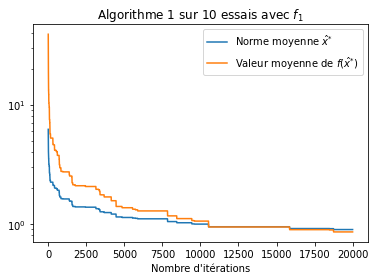

In [17]:
nb_means = 10
algo_1_runs = [algo_1(f=f1, n=5, x0=(1,1,1,1,1), tmax=2*10**4) for _ in range(nb_means)]
ts = algo_1_runs[0][2]

x_norms = [np.linalg.norm(algo_1_runs[i][1], axis=1) for i in range(nb_means)]
x_norms_means = sum(x_norms) / nb_means

fx_norms = [abs(np.array([f1(line) for line in algo_1_runs[i][1]])) for i in range(nb_means)]
fx_norms_means = sum(fx_norms) / nb_means

plt.semilogy(ts, x_norms_means , label='Norme moyenne $\hat{x}^{*}$')
plt.semilogy(ts, fx_norms_means, label='Valeur moyenne de $f(\hat{x}^{*})$')
plt.legend()
plt.xlabel('Nombre d\'itérations')
plt.title('Algorithme 1 sur 10 essais avec $f_1$')
plt.show()

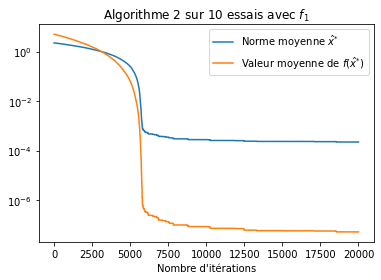

In [18]:
nb_means = 10
algo_2_runs = [algo_2(f=f1, n=5, x0=(1,1,1,1,1), step_size=10**-3, tmax=2*10**4) for _ in range(nb_means)]
ts = algo_2_runs[0][2]

x_norms = [np.linalg.norm(algo_2_runs[i][1], axis=1) for i in range(nb_means)]
x_norms_means = sum(x_norms) / nb_means

fx_norms = [abs(np.array([f1(line) for line in algo_2_runs[i][1]])) for i in range(nb_means)]
fx_norms_means = sum(fx_norms) / nb_means

plt.semilogy(ts, x_norms_means , label='Norme moyenne $\hat{x}^{*}$')
plt.semilogy(ts, fx_norms_means, label='Valeur moyenne de $f(\hat{x}^{*})$')
plt.legend()
plt.xlabel('Nombre d\'itérations')
plt.title('Algorithme 2 sur 10 essais avec $f_1$')
plt.show()

### Question 7.

On peut distinguer trois phases.
* La première où la recherche avance laborieusement. Elle tâtonne dans des zones qui ne changent pas vraiment de hauteur.
* La deuxième où un fort creux a été trouvé. Elle descend très vite.
* La troisième et dernière où elle a atteint un minimum local, et même _le_ minimum réel dans le cas de $f_1$. La recherche ne progresse plus et stagne.

### Question 8.

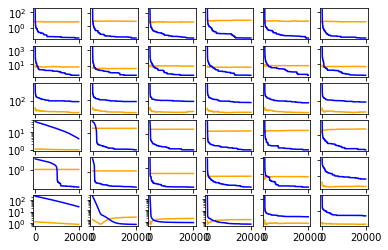

In [19]:
algorithmes = (algo_1, algo_2)
step_sizes = (10**-4, 10**-3, 10**-2, 10**-1, 1, 10)
fs = (f2, f3, f4)
nb_means = 10
fig, axs = plt.subplots(6, 6)
x, y = 0, 0

for algo in algorithmes:
    for f in fs:
        for step_size in step_sizes:
            algo_runs = [algo(f=f, n=5, x0=np.random.random((5,))*2-1, step_size=step_size, tmax=2*10**4) for _ in range(nb_means)]
            ts = algo_runs[0][2]

            x_norms = [np.linalg.norm(algo_runs[i][1], axis=1) for i in range(nb_means)]
            x_norms_means = sum(x_norms) / nb_means

            fxs_abs = [abs(np.array([f(line) for line in algo_runs[i][1]])) for i in range(nb_means)]
            fxs_abs_means = sum(fxs_abs) / nb_means
            
            ax = axs[y][x]
            ax.semilogy(ts, x_norms_means, c='orange')
            ax.semilogy(ts, fxs_abs_means, c='blue')
            x = (x+1) % 6
            ax.label_outer()
        y += 1

Il était difficile de trouver une bonne représentation pour autant de graphes, alors j'ai opté pour celle-ci avec peu de légendes car sinon tout se superposait dans tous les sens.

 * En **orange**, _la norme de $x$_
 * en **bleu**, _la valeur absolue de $f(x)$_.

 * Les 3 premières lignes sont avec l'algorithme 1
 * Les 3 dernières lignes sont avec l'algorithme 2

 * Les lignes 1 et 4 sont avec $f1$
 * Les lignes 2 et 5 sont avec $f2$
 * Les lignes 3 et 6 sont avec $f3$

Les colonnes sont respectivement pour des valeurs de $\theta$ étant : $10^{-4}$, $10^{-3}$, $10^{-2}$, $10^{-1}$, $1$ et $10$